In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
df = pd.read_csv('novo_arquivo.csv')
df.head()

,id_da_compra,data,hora,cliente,produto,valor,quantidade,total,status,cidade,estado,pais,cep,frete,pagamento,vendedor,marca
0,13679,2021-03-20,23:35:51,LUCAS Araujo Kuhn,Queijo Mussarela,16.87,13,239.31,Pagamento Confirmado,Niterói,RJ,Brasil,24000-000,20.0,Cartão de Crédito,SAMUEL HENRIQUE CAÇADOR,Porto Alegre
1,28070,2020-10-30,09:00:53,MICAEL SOUZA RONCETE,Molho de Tomate,3.25,3,9.75,Pagamento Confirmado,Mariana,MG,Brasil,35420-000,0.0,Pix,MICAEL MALAQUIAS DE SOUZA OLIVEIRA,Fugini
2,47484,2021-06-09,15:30:28,FELIPE AUGUSTO NERY SILVA,Água Mineral,1.63,9,36.67,Pagamento Confirmado,Cabo Frio,RJ,Brasil,28900-000,22.0,Transferência Bancária,HENRICO MATOS LIMA DA CUNHA,Minalba
3,20809,2022-06-04,08:41:23,LEVI RIBEIRO AMORIM,Carvão,8.74,4,54.96,Em Separação,Campos dos Goytacazes,RJ,Brasil,28000-000,20.0,Pix,GABRIEL QUEIROZ DE AGUIAR,Marca-Brás
4,47123,2019-05-04,13:38:45,GABRIEL MATOS LIMA DA CUNHA,Café,9.48,2,18.96,Em Separação,Conselheiro Lafaiete,MG,Brasil,36400-000,0.0,Cartão de Crédito,HENRICO MATOS LIMA DA CUNHA,3 Corações


## Objetivo
Este código realiza a padronização dos nomes de estados no DataFrame, convertendo nomes de cidades para suas respectivas siglas de estados (UF).

## Processo de Padronização
1. **Mapeamento de Estados**
   - Cria um dicionário que relaciona nomes de cidades com suas respectivas siglas de estados
   - Abrange principalmente cidades dos estados de:
     - Minas Gerais (MG)
     - São Paulo (SP)
     - Rio de Janeiro (RJ)
     - Tocantins (TO)

2. **Função de Padronização**
   - Função `padronizar_Estado` que:
     - Verifica se o valor é nulo (mantém o valor original se for)
     - Busca o nome da cidade no dicionário de mapeamento
     - Retorna a sigla do estado correspondente
     - Mantém o valor original se não encontrar no mapeamento

3. **Aplicação da Padronização**
   - Aplica a função de padronização na coluna 'estado'
   - Exibe a contagem de valores antes e depois da padronização
   - Salva os dados padronizados em um novo arquivo CSV

## Resultado
- Dados padronizados com siglas de estados
- Consistência na representação dos estados
- Facilidade na análise e agregação de dados por estado
- Preservação de valores nulos quando existentes

In [6]:
# Muda nomes de estados com nome de cidades para siglas de estados
display(df['estado'].value_counts())

def padronizar_Estado(cargo):
    mapping = {
        'Belo Horizonte': 'MG',
        'Viçosa': 'MG',
        'São Paulo': 'SP',
        'Rio de Janeiro': 'RJ',
        'Conselheiro Lafaiete': 'MG',
        'São João de Meriti': 'RJ',
        'Ewbank da Câmara': 'MG',
        'Muriaé': 'MG',
        'Cabo Frio': 'RJ',
        'Prados': 'MG',
        'São José dos Campos': 'SP',
        'Barroso': 'MG',
        'Nova Iguaçu': 'RJ',
        'Duque de Caxias': 'RJ',
        'Itaboraí': 'RJ',
        'Ouro Preto': 'MG',
        'Mariana': 'MG',
        'Congonhas': 'MG',
        'Carandaí': 'MG',
        'Tocantins': 'TO',
        'Barbacena': 'MG',
        'Campinas': 'SP',
        'Angra dos Reis': 'RJ',
        'Volta Redonda': 'RJ',
        'Magé': 'RJ',
        'Lima Duarte': 'MG',
        'São Vicente de Minas': 'MG',
        'Belford Roxo': 'RJ',
        'Tiradentes': 'MG',
        'Santana do Garambéu': 'MG',
        'Petrópolis': 'RJ',
        'Guarulhos': 'SP',
        'Santos Dumont': 'MG',
        'Leopoldina': 'MG',
        'Macaé': 'RJ',
        'Santo André': 'SP',
        'São Bernardo do Campo': 'SP',
        'Lagoa Dourada': 'MG',
        'Ouro Branco': 'MG',
        'Juiz de Fora': 'MG',
        'Cataguases': 'MG',
        'Niterói': 'RJ',
        'Ritápolis': 'MG',
        'São Tiago': 'MG',
        'São Gonçalo': 'RJ',
        'Ubá': 'MG',
        'Astolfo Dutra': 'MG',
        'Matias Barbosa': 'MG',
        'Coronel Xavier Chaves': 'MG',
        'Resende Costa': 'MG',
        'São João Nepomuceno': 'MG',
        'Bicas': 'MG',
        'São João del-Rei': 'MG',
        'Campos dos Goytacazes': 'RJ',
        'Palma': 'MG',
        'Simão Pereira': 'MG'
    }
    if pd.isnull(cargo):
        return cargo
    return mapping.get(cargo, cargo)

# Aplique a função para padronizar os cargos:
df['estado'] = df['estado'].apply(padronizar_Estado)

# Confira os cargos após a padronização:
print("Cargos após a padronização:")
display(df['estado'].value_counts())

df.to_csv('novo_arquivo.csv', index=False) 



estado
MG           226050
RJ            98179
SP            38018
São Paulo       786
PSC             147
PR              140
RS              135
MTSa            130
Name: count, dtype: int64

Cargos após a padronização:


estado
MG      226050
RJ       98179
SP       38804
PSC        147
PR         140
RS         135
MTSa       130
Name: count, dtype: int64

# Tratamento de Valores de Frete

## Objetivo
Este código realiza o tratamento de valores inválidos na coluna 'frete' do DataFrame, substituindo-os por valores calculados com base na média do estado correspondente.

## Processo de Tratamento
1. **Conversão de Dados**
   - Converte a coluna 'frete' para valores numéricos
   - Valores não numéricos são convertidos para NaN (Not a Number)

2. **Tratamento de Valores Nulos**
   - Valores NaN são substituídos pela média do frete do estado correspondente
   - A média é calculada considerando apenas valores válidos (>= 0)

3. **Correção de Valores Negativos**
   - Valores negativos são ajustados usando a média do estado
   - O ajuste é feito adicionando a diferença entre a média e o valor negativo

4. **Formatação Final**
   - Todos os valores são arredondados para 2 casas decimais
   - Os dados tratados são salvos em um novo arquivo CSV

## Resultado
- DataFrame com valores de frete válidos e consistentes
- Dados organizados por estado
- Valores numéricos padronizados

In [9]:
import pandas as pd
import numpy as np


# Converte a coluna 'frete' para numérica, substituindo valores não numéricos por NaN
df['frete'] = pd.to_numeric(df['frete'], errors='coerce')

# Substitui valores NaN por um valor calculado com base na média do estado
df.loc[df['frete'].isnull(), 'frete'] = df.groupby('estado')['frete'].transform(lambda x: x[x >= 0].mean())

# Substitui valores negativos por um valor calculado com base na média do estado
df.loc[df['frete'] < 0, 'frete'] = df.loc[df['frete'] < 0, 'frete'] + (df.groupby('estado')['frete'].transform(lambda x: x[x >= 0].mean()) - df.loc[df['frete'] < 0, 'frete'])

# Arredonda os valores da coluna 'frete' para 2 casas decimais
df['frete'] = df['frete'].apply(lambda x: round(x, 2))

# Salva o DataFrame em um novo arquivo CSV
df.to_csv('novo_arquivo.csv', index=False)

# Exibe as primeiras linhas do DataFrame
df.head()

display(df.isna().sum())




id_da_compra    0
data            0
hora            0
cliente         0
produto         0
valor           0
quantidade      0
total           0
status          0
cidade          0
estado          0
pais            0
cep             0
frete           0
pagamento       0
vendedor        0
marca           0
dtype: int64

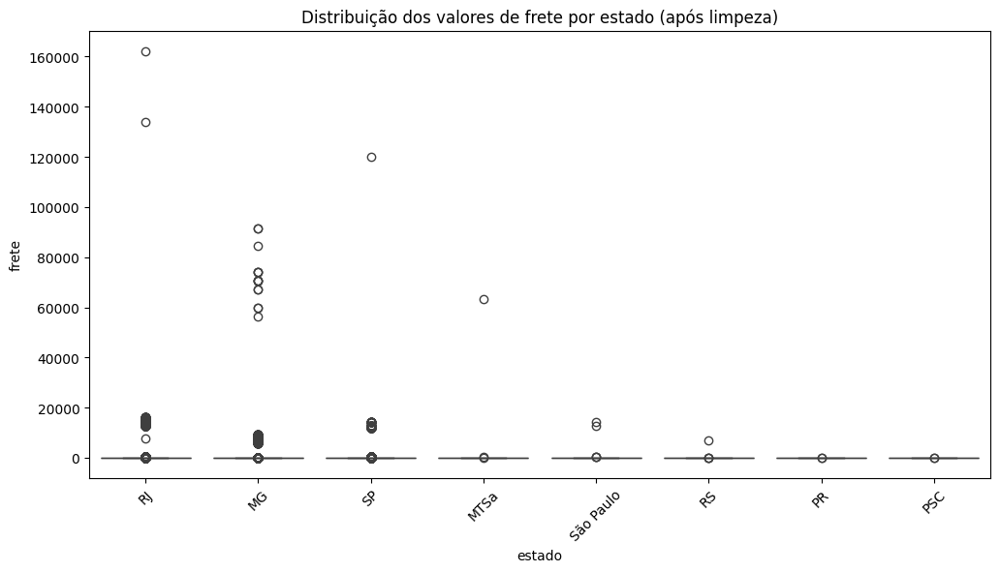

frete
0.00         185341
10.00         27377
18.00         17933
9.00          15591
20.00         15116
              ...  
497.09            1
7.26              1
162150.00         1
56400.00          1
84600.00          1
Name: count, Length: 72, dtype: int64


In [ ]:
plt.figure(figsize=(12,6))
sns.boxplot(data=df, x='estado', y='frete')
plt.title('Distribuição dos valores de frete por estado (após limpeza)')
plt.xticks(rotation=45)
plt.show()

# Validação e Correção de CEPs

## Objetivo
Este código realiza a validação e correção de CEPs (Código de Endereçamento Postal) no DataFrame, garantindo que todos os CEPs sigam o formato padrão brasileiro e sejam válidos.

## Processo de Validação e Correção
1. **Função de Validação**
   - Função `validar_cep` que verifica:
     - Formato numérico de 8 dígitos
     - Presença opcional de hífen
     - Primeiro dígito diferente de zero
     - Não pode ser '00000-000'

2. **Identificação de CEPs Válidos**
   - Agrupa os CEPs por estado
   - Filtra CEPs válidos baseado em:
     - Comprimento de 9 caracteres (incluindo hífen)
     - Primeiro dígito diferente de zero

3. **Correção de CEPs Inválidos**
   - Para cada CEP inválido:
     - Verifica se é um número válido
     - Verifica o comprimento correto
     - Verifica se é maior que zero
     - Substitui por um CEP válido do mesmo estado
     - Se não houver CEP válido no estado, gera um novo CEP válido

## Resultado
- DataFrame com CEPs padronizados e válidos
- Preservação da relação CEP-Estado
- Eliminação de CEPs inválidos ou mal formatados
- Dados salvos em novo arquivo CSV com as correções

In [8]:
import pandas as pd
import re

# Função para validar CEPs
def validar_cep(cep):
    cep = str(cep)  # Converter o valor para string
    if re.match(r'^\d{8}$', cep.replace('-', '')) and cep.replace('-', '')[0] != '0' and cep != '00000-000':  # Remover o hífen antes de validar e verificar se o primeiro dígito não é zero e se o CEP não é igual a '00000-000'
        return True
    else:
        return False

# Carregar o arquivo CSV
df = pd.read_csv('vendas_modi.csv', header=0)

# Criar uma lista de CEPs válidos por estado# Criar uma lista de CEPs válidos por estado
ceps_validos_por_estado = df.groupby('estado')['cep'].apply(lambda x: x[(x.str.len() == 9) & (x.str[0] != '0')].unique())

# Substituir CEPs inválidos por válidos do mesmo estado
df['cep'] = df.apply(lambda row: row['cep'] if row['cep'].replace('-', '').isdigit() and len(row['cep'].replace('-', '')) == 8 and int(row['cep'].replace('-', '')) > 0 else (ceps_validos_por_estado[row['estado']][0] if len(ceps_validos_por_estado[row['estado']]) > 0 else gerar_cep_valido()), axis=1)
display(df['cep'].value_counts())  # Acessar a coluna pelo nome

df.to_csv('novo_arquivo.csv', index=False)  # Acessar a coluna pelo nome

cep
35420-000    11325
24000-000     8388
13000-000     7253
28900-000     7059
36780-000     6811
27200-000     6776
36710-000     6697
27900-000     6674
25500-000     6669
36570-000     6654
07000-000     6634
25600-000     6629
20000-000     6626
36140-000     6606
36280-000     6580
36200-000     6545
36000-000     6532
35400-000     6532
36770-000     6531
36345-000     6530
25000-000     6506
36415-000     6486
36335-000     6483
36240-000     6482
37370-000     6476
36330-000     6472
23900-000     6471
36400-000     6459
36325-000     6452
36510-000     6448
24800-000     6445
36120-000     6444
28000-000     6438
36600-000     6433
36680-000     6417
36880-000     6416
36340-000     6414
36320-000     6408
09000-000     6380
09700-000     6378
01000-000     6346
36420-000     6330
25900-000     6323
36700-000     6309
36500-000     6306
30000-000     6304
36196-000     6300
24400-000     6280
26000-000     6279
36350-000     6224
12200-000     6220
36108-000     6205
36123-00

# Tratamento de Datas

## Objetivo
Este código realiza o tratamento e padronização de datas no DataFrame, garantindo que todas as entradas de data sejam válidas e estejam no formato correto.

## Processo de Tratamento
1. **Carregamento dos Dados**
   - Leitura do arquivo CSV com configurações específicas:
     - Interpretação automática da coluna 'data' como tipo datetime
     - Formato de data com dia primeiro (dayfirst=True)

2. **Validação de Datas**
   - Criação de coluna auxiliar 'data_valida'
   - Verificação de valores nulos na coluna de data
   - Identificação de datas inválidas

3. **Correção de Datas**
   - Substituição de datas inválidas (nulas) por uma data padrão:
     - Data padrão definida como '2024-01-01'
     - Conversão para o formato de data apropriado
   - Preservação de datas válidas existentes

4. **Limpeza e Salvamento**
   - Remoção da coluna auxiliar 'data_valida'
   - Salvamento do DataFrame tratado em novo arquivo CSV
   - Verificação das datas únicas presentes no conjunto de dados

## Resultado
- DataFrame com todas as datas válidas
- Padronização do formato de data
- Eliminação de valores nulos na coluna de data
- Dados salvos em novo arquivo CSV com as correções

In [9]:
import pandas as pd

# Leia o CSV e mantenha o formato da coluna 'data' como date
df = pd.read_csv('novo_arquivo.csv', header=0, parse_dates=['data'], dayfirst=True)

# Verifique se a data é válida
df['data_valida'] = df['data'].notnull()

# Transforme as datas inválidas em válidas
df['data'] = df['data'].apply(lambda x: x if pd.notnull(x) else pd.to_datetime('2024-01-01').date())

# Verifique as datas únicas
print(df['data'].unique())

df = df.drop('data_valida', axis=1)

df.to_csv('novo_arquivo.csv', index=False)


C:\Users\samue\AppData\Local\Temp\ipykernel_20228\1399578289.py:4: UserWarning: Parsing dates in %Y-%m-%d format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  df = pd.read_csv('novo_arquivo.csv', header=0, parse_dates=['data'], dayfirst=True)


<DatetimeArray>
['2021-03-20 00:00:00', '2020-10-30 00:00:00', '2021-06-09 00:00:00',
 '2022-06-04 00:00:00', '2019-05-04 00:00:00', '2018-02-19 00:00:00',
 '2018-04-21 00:00:00', '2020-09-25 00:00:00', '2018-06-20 00:00:00',
 '2018-10-01 00:00:00',
 ...
 '2022-02-18 00:00:00', '2022-04-14 00:00:00', '2019-08-03 00:00:00',
 '2020-07-01 00:00:00', '2019-07-19 00:00:00', '2018-04-28 00:00:00',
 '2018-10-27 00:00:00', '2022-08-13 00:00:00', '2018-06-18 00:00:00',
 '2022-09-10 00:00:00']
Length: 999, dtype: datetime64[ns]


# Padronização de Nomes de Produtos

## Objetivo
Este código realiza a padronização dos nomes de produtos no DataFrame, corrigindo erros de digitação, caracteres especiais e variações de escrita para garantir consistência nos dados.

## Processo de Padronização
1. **Mapeamento de Correções**
   - Dicionário abrangente que mapeia:
     - Nomes com caracteres especiais (ex: 'Café#$@!' → 'Café')
     - Erros de digitação (ex: 'Refrigkrante' → 'Refrigerante')
     - Variações de escrita (ex: 'Scl' → 'Sal')
     - Nomes mal formatados (ex: 'Papel qoalha' → 'Papel Toalha')

2. **Função de Padronização**
   - Função `padronizar_Produto` que:
     - Verifica se o valor é nulo (mantém o valor original se for)
     - Busca o nome do produto no dicionário de correções
     - Retorna o nome padronizado se encontrado
     - Mantém o nome original se não encontrar no mapeamento

3. **Aplicação das Correções**
   - Aplica a função de padronização na coluna 'produto'
   - Salva os dados padronizados em novo arquivo CSV
   - Exibe a lista de produtos únicos após a padronização

## Produtos Padronizados
- Bebidas: Café, Refrigerante, Água Mineral, Suco de Laranja, Vinho, Cerveja
- Alimentos: Pão de Forma, Macarrão, Farinha de Trigo, Arroz, Feijão
- Laticínios: Manteiga, Queijo Mussarela, Leite Integral
- Produtos de Limpeza: Sabão em Pó, Amaciante, Desinfetante, Detergente
- Higiene: Pasta de Dente, Sabonete, Shampoo, Condicionador, Papel Higiênico
- Outros: Açúcar, Sal, Presunto, Molho de Tomate, Óleo de Soja

## Resultado
- DataFrame com nomes de produtos padronizados
- Eliminação de caracteres especiais e erros de digitação
- Consistência na nomenclatura dos produtos
- Facilidade na análise e agregação de dados por produto

In [10]:
import pandas as pd

# Carregue o arquivo CSV
df = pd.read_csv('novo_arquivo.csv')

# Defina a função para padronizar os produtos
def padronizar_Produto(produto):
    mapping = {
        'Café#$@!': 'Café',
        'Pão de Forma#$@!': 'Pão de Forma',
        'Sabão em Pó#$@!': 'Sabão em Pó',
        'Amaciante#$@!': 'Amaciante',
        'Desinfetante#$@!': 'Desinfetante',
        'Refrigerante#$@!': 'Refrigerante',
        'Açúcar#$@!': 'Açúcar',
        'Papel Toalha#$@!': 'Papel Toalha',
        'Macarrão#$@!': 'Macarrão',
        'Farinha de Trigo#$@!': 'Farinha de Trigo',
        'Manteiga#$@!': 'Manteiga',
        'Pasta de Dente#$@!': 'Pasta de Dente',
        'Queijo Mussarela#$@!': 'Queijo Mussarela',
        'Desinfetante#$@!': 'Desinfetante',
        'Água Mineral#$@!': 'Água Mineral',
        'Molho de Tomate#$@!': 'Molho de Tomate',
        'Sal#$@!': 'Sal',
        'Presunto#$@!': 'Presunto',
        'Sabonete#$@!': 'Sabonete',
        'Suco de Laranja#$@!': 'Suco de Laranja',
        'Papel Higiênico#$@!': 'Papel Higiênico',
        'Amaciante#$@!': 'Amaciante',
        'Condicionador#$@!': 'Condicionador',
        'Detergente#$@!': 'Detergente',
        'Vinho#$@!': 'Vinho',
        'Feijão#$@!': 'Feijão',
        'Biscoito Recheado#$@!': 'Biscoito Recheado',
        'Cerveja#$@!': 'Cerveja',
        'Shampoo#$@!': 'Shampoo',
        'Óleo de Soja#$@!': 'Óleo de Soja',
        'Leite Integral#$@!': 'Leite Integral',
        'Sabão em Pó#$@!': 'Sabão em Pó',
        'Arroz#$@!': 'Arroz',
        'Refrigkrante': 'Refrigerante',
        'Carvão#$@!': 'Carvão',
        'Scl': 'Sal',
        'Papel qoalha': 'Papel Toalha',
        'Desinfetanue': 'Desinfetante',
        'Qbeijo Mussarela': 'Queijo Mussarela',
        'Água Mineras': 'Água Mineral',
        'Presuntd': 'Presunto',
        'Macawrão': 'Macarrão',
        'Sucoyde Laranja': 'Suco de Laranja',
        'Clfé': 'Café',
        'Desinfekante': 'Desinfetante',
        'Majarrão': 'Macarrão',
        'Cnfé': 'Café',
        'Farinha de Tripo': 'Farinha de Trigo',
        'Manteigt': 'Manteiga',
        'zabonete': 'Sabonete',
        'Mqcarrão': 'Macarrão',
        'Arroc': 'Arroz',
        'tal': 'Sal',
        'Sabonepe': 'Sabão em Pó',
        'Papel Twalha': 'Papel Toalha',
        'Água Mineual': 'Água Mineral',
        'Condicioiador#$@!': 'Condicionador',
        'Condibionador': 'Condicionador',
        'Caft': 'Café',
        'ieijão': 'Feijão',
        'Açúcaz': 'Açúcar',
        'Amaciayte': 'Amaciante',
        'Caff': 'Café',
        'Mopho de Tomate': 'Molho de Tomate',
        'Molmo de Tomate': 'Molho de Tomate',
        'Biscoitq Recheado': 'Biscoito Recheado',
        'Macirrão': 'Macarrão',
        'Deqergente': 'Detergente',
        'Deterwente': 'Detergente',
        'Cafc': 'Café',
        'Queijo Mussarelz': 'Queijo Mussarela',
        'Slc': 'Sal',
        'Tal': 'Sal',
    }
    if pd.isnull(produto):
        return produto
    return mapping.get(produto, produto)

# Aplique a função para padronizar os produtos
df['produto'] = df['produto'].apply(padronizar_Produto)

# Salve o arquivo CSV atualizado
df.to_csv('novo_arquivo.csv', index=False)

# Imprima os produtos únicos
print(df['produto'].unique())


['Queijo Mussarela' 'Molho de Tomate' 'Água Mineral' 'Carvão' 'Café'
 'Feijão' 'Condicionador' 'Sabonete' 'Açúcar' 'Manteiga' 'Papel Higiênico'
 'Óleo de Soja' 'Vinho' 'Macarrão' 'Shampoo' 'Presunto' 'Cerveja'
 'Papel Toalha' 'Pasta de Dente' 'Pão de Forma' 'Sabão em Pó' 'Amaciante'
 'Desinfetante' 'Refrigerante' 'Arroz' 'Farinha de Trigo'
 'Biscoito Recheado' 'Sal' 'Suco de Laranja' 'Leite Integral' 'Detergente']


# Tratamento de Valores Monetários e Cálculos

## Objetivo
Este código realiza o tratamento e padronização de valores monetários no DataFrame, garantindo a consistência dos dados e realizando cálculos corretos de totais.

## Processo de Tratamento
1. **Verificação Inicial**
   - Análise inicial de valores nulos em todas as colunas
   - Identificação de dados inconsistentes

2. **Padronização de Valores Monetários**
   - Tratamento da coluna 'valor':
     - Remoção do símbolo 'R$'
     - Substituição de vírgula por ponto para formato decimal
     - Conversão para valores numéricos
     - Substituição de valores inválidos por zero

3. **Tratamento de Colunas Numéricas**
   - Padronização das colunas:
     - 'total'
     - 'quantidade'
     - 'frete'
   - Conversão para valores numéricos
   - Substituição de valores nulos por zero

4. **Cálculo do Total**
   - Fórmula aplicada:
     - Total = (Valor × Quantidade) + Frete
   - Garantia de valores consistentes
   - Preservação da lógica de negócio

5. **Verificação Final**
   - Nova análise de valores nulos
   - Confirmação da consistência dos dados
   - Salvamento dos dados tratados

## Resultado
- DataFrame com valores monetários padronizados
- Cálculos de total corretos e consistentes
- Eliminação de valores nulos
- Dados prontos para análise
- Formato numérico adequado para todas as colunas monetárias

In [ ]:
import pandas as pd

# Carregar o arquivo CSV
df = pd.read_csv('novo_arquivo.csv')

# Verificar a presença de valores nulos
print(df.isna().sum())

# Remover o "R$" do valor
df['valor'] = df['valor'].str.replace('R$', '')

# Remover a vírgula e substituir por ponto
df['valor'] = df['valor'].str.replace(',', '.')

# Transformar os valores não numéricos em NaN
df['valor'] = pd.to_numeric(df['valor'], errors='coerce')

# Substituir os NaN por um valor válido (por exemplo, 0)
df['valor'] = df['valor'].fillna(0)

# Transformar os valores não numéricos em NaN
df['total'] = pd.to_numeric(df['total'], errors='coerce')
df['quantidade'] = pd.to_numeric(df['quantidade'], errors='coerce')
df['frete'] = pd.to_numeric(df['frete'], errors='coerce')

# Substituir os NaN por um valor válido (por exemplo, 0)
df['total'] = df['total'].fillna(0)
df['quantidade'] = df['quantidade'].fillna(0)
df['frete'] = df['frete'].fillna(0)

# Calcular o valor total de acordo com a fórmula
df['total'] = df['valor'] * df['quantidade'] + df['frete']


df.to_csv('novo_arquivo.csv', index=False)

df.head()

id_da_compra       0
data               0
hora               0
cliente            0
produto            0
valor              0
quantidade         0
total           3685
status             0
cidade             0
estado             0
pais               0
cep                0
frete           7371
pagamento          0
vendedor        3680
marca              0
dtype: int64
id_da_compra       0
data               0
hora               0
cliente            0
produto            0
valor              0
quantidade         0
total              0
status             0
cidade             0
estado             0
pais               0
cep                0
frete              0
pagamento          0
vendedor        3680
marca              0
dtype: int64


,id_da_compra,data,hora,cliente,produto,valor,quantidade,total,status,cidade,estado,pais,cep,frete,pagamento,vendedor,marca
0,13679,2021-03-20,23:35:51,LUCAS Araujo Kuhn,Queijo Mussarela,16.87,13,239.31,Pagamento Confirmado,Niterói,RJ,Brasil,24000-000,20.0,Cartão de Crédito,SAMUEL HENRIQUE CAÇADOR,Porto Alegre
1,28070,2020-10-30,09:00:53,MICAEL SOUZA RONCETE,Molho de Tomate,3.25,3,9.75,Pagamento Confirmado,Mariana,MG,Brasil,35420-000,0.0,Pix,MICAEL MALAQUIAS DE SOUZA OLIVEIRA,Fugini
2,47484,2021-06-09,15:30:28,FELIPE AUGUSTO NERY SILVA,Água Mineral,1.63,9,36.67,Pagamento Confirmado,Cabo Frio,RJ,Brasil,28900-000,22.0,Transferência Bancária,HENRICO MATOS LIMA DA CUNHA,Minalba
3,20809,2022-06-04,08:41:23,LEVI RIBEIRO AMORIM,Carvão,8.74,4,54.96,Em Separação,Campos dos Goytacazes,RJ,Brasil,28000-000,20.0,Pix,GABRIEL QUEIROZ DE AGUIAR,Marca-Brás
4,47123,2019-05-04,13:38:45,GABRIEL MATOS LIMA DA CUNHA,Café,9.48,2,18.96,Em Separação,Conselheiro Lafaiete,MG,Brasil,36400-000,0.0,Cartão de Crédito,HENRICO MATOS LIMA DA CUNHA,3 Corações


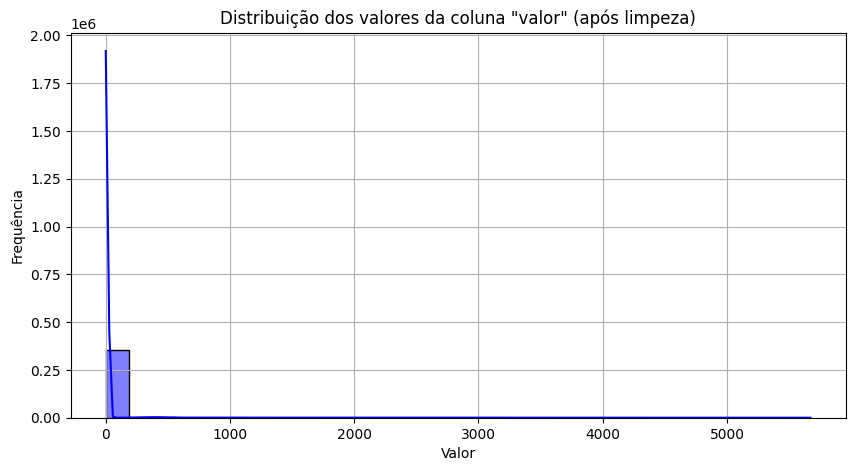

total
28.80     238
24.00     237
39.60     216
36.00     213
37.80     212
         ... 
162.29      1
82.46       1
236.54      1
207.61      1
339.04      1
Name: count, Length: 36848, dtype: int64
id_da_compra    0
data            0
hora            0
cliente         0
produto         0
valor           0
quantidade      0
total           0
status          0
cidade          0
estado          0
pais            0
cep             0
frete           0
pagamento       0
vendedor        0
marca           0
dtype: int64


In [19]:
plt.figure(figsize=(10, 5))
sns.histplot(df['valor'], kde=True, color='blue', bins=30)
plt.title('Distribuição dos valores da coluna "valor" (após limpeza)')
plt.xlabel('Valor')
plt.ylabel('Frequência')
plt.grid(True)
plt.show()

print(df['total'].value_counts())
print(df.isna().sum())

# Relacionamento Cliente-Vendedor

## Objetivo
Este código estabelece e mantém o relacionamento entre clientes e vendedores no DataFrame, preenchendo valores ausentes de vendedores com base no histórico de compras dos clientes.

## Processo de Implementação
1. **Criação do Relacionamento**
   - Dicionário `relacao_clientes_vendedores` que armazena:
     - Cliente como chave primária
     - Vendedor como chave secundária
     - Contagem de interações como valor

2. **Construção do Histórico**
   - Para cada registro no DataFrame:
     - Identificação do cliente e vendedor
     - Incremento do contador de interações
     - Preservação do histórico de relacionamentos

3. **Preenchimento de Valores Ausentes**
   - Para cada vendedor ausente (NaN):
     - Identificação do cliente correspondente
     - Busca do vendedor mais frequente no histórico
     - Atribuição do vendedor mais comum ao cliente

4. **Análise e Verificação**
   - Contagem de vendedores por cliente
   - Lista de vendedores únicos
   - Lista de clientes únicos
   - Distribuição de clientes por vendedor

## Resultado
- DataFrame com todos os vendedores preenchidos
- Relacionamentos cliente-vendedor preservados
- Dados consistentes baseados no histórico
- Informações úteis para análise de relacionamentos
- Salvamento dos dados atualizados

## Benefícios
- Manutenção da consistência dos dados
- Preservação do histórico de relacionamentos
- Melhoria na qualidade dos dados
- Facilidade na análise de padrões de venda

In [12]:
import pandas as pd

df = pd.read_csv('novo_arquivo.csv')

import pandas as pd
# Crie um dicionário para armazenar a relação entre clientes e vendedores
relacao_clientes_vendedores = {}

# Preencha o dicionário com as informações existentes
for i, row in df.iterrows():
    if not pd.isnull(row['vendedor']):
        cliente = row['cliente']
        vendedor = row['vendedor']
        if cliente not in relacao_clientes_vendedores:
            relacao_clientes_vendedores[cliente] = {}
        if vendedor not in relacao_clientes_vendedores[cliente]:
            relacao_clientes_vendedores[cliente][vendedor] = 0
        relacao_clientes_vendedores[cliente][vendedor] += 1

# Preencha os valores NaN na coluna "vendedores" com o nome do vendedor mais frequente
for i, row in df.iterrows():
    if pd.isnull(row['vendedor']):
        cliente = row['cliente']
        if cliente in relacao_clientes_vendedores:
            vendedor_mais_frequente = max(relacao_clientes_vendedores[cliente], key=relacao_clientes_vendedores[cliente].get)
            df.loc[i, 'vendedor'] = vendedor_mais_frequente

df.to_csv('novo_arquivo.csv', index=False)

print(df['vendedor'].value_counts())

print(df['vendedor'].unique())

print(df['cliente'].unique())

print(df['cliente'].value_counts())

vendedor
PAULO SOUZA RONCETE                     37310
VICTOR GONÇALVES DONADONI               37219
GABRIEL QUEIROZ DE AGUIAR               37078
FELIPE HENRIQUE COSTA BARNABE MARAZO    37005
CARLOS QUEIROZ DE AGUIAR                36998
MICAEL MALAQUIAS DE SOUZA OLIVEIRA      36906
HENRICO VICTOR ALVES                    36798
LUCAS VITOR FAÇANHA NEVES               36598
HENRICO MATOS LIMA DA CUNHA             36597
SAMUEL HENRIQUE CAÇADOR                 36243
Name: count, dtype: int64
['SAMUEL HENRIQUE CAÇADOR' 'MICAEL MALAQUIAS DE SOUZA OLIVEIRA'
 'HENRICO MATOS LIMA DA CUNHA' 'GABRIEL QUEIROZ DE AGUIAR'
 'VICTOR GONÇALVES DONADONI' 'FELIPE HENRIQUE COSTA BARNABE MARAZO'
 'HENRICO VICTOR ALVES' 'CARLOS QUEIROZ DE AGUIAR'
 'LUCAS VITOR FAÇANHA NEVES' 'PAULO SOUZA RONCETE']
['LUCAS Araujo Kuhn' 'MICAEL SOUZA RONCETE' 'FELIPE AUGUSTO NERY SILVA'
 ... ' KALLEBE ANTÔNIO DE DECCO OLIVEIRA  ' ' LEVI SOUZA RONCETE  '
 ' ARTHUR JOSÉ SILVA MATIAS  ']
cliente
VICTOR HENRIQUE CAÇADOR        

# Limpeza de Nomes de Clientes

## Objetivo
Este código realiza a limpeza e padronização dos nomes dos clientes no DataFrame, removendo caracteres especiais e mantendo apenas caracteres alfanuméricos e espaços.

## Processo de Limpeza
1. **Função de Limpeza**
   - Função `remover_caracteres_especiais` que:
     - Utiliza expressão regular para identificar caracteres não permitidos
     - Mantém apenas:
       - Letras (a-z, A-Z)
       - Números (0-9)
       - Espaços em branco
     - Remove todos os outros caracteres especiais

2. **Aplicação da Limpeza**
   - Processamento da coluna 'cliente'
   - Aplicação da função de limpeza em todos os registros
   - Preservação da estrutura original dos nomes
   - Manutenção da legibilidade

3. **Verificação e Salvamento**
   - Análise da distribuição dos nomes após limpeza
   - Contagem de ocorrências por nome
   - Salvamento dos dados padronizados

## Resultado
- Nomes de clientes padronizados
- Eliminação de caracteres especiais
- Dados mais limpos e consistentes
- Facilidade na busca e análise
- Preservação da legibilidade dos nomes

## Benefícios
- Melhoria na qualidade dos dados
- Padronização da base de clientes
- Facilidade na análise e relatórios

In [ ]:
import pandas as pd
import re

# Leia o arquivo CSV
df = pd.read_csv('novo_arquivo.csv')

# Defina uma função para remover os caracteres que não fazem parte de um nome
def remover_caracteres_especiais(nome):
    return re.sub(r'[^a-zA-Z\s0-9]', '', nome)

# Aplique a função ao campo "cliente"
df['cliente'] = df['cliente'].apply(remover_caracteres_especiais)

df.to_csv('novo_arquivo.csv', index=False)

print(df['cliente'].value_counts())



cliente
VICTOR HENRIQUE CAADOR             2586
JOO QUEIROZ DE AGUIAR              1783
SAMUEL VITOR FAANHA NEVES          1754
VICTOR SILVINO DA SILVA            1748
MATEUS ANTNIO DE DECCO OLIVEIRA    1746
                                   ... 
KALLEBE VIEIRA DEMARQUE             259
VICTOR STANZANI DE JESUS            256
TIAGO CARLOS DE SOUZA               255
PAULO Araujo Kuhn                   251
PAULO ANTNIO DE SOUZA NETO          248
Name: count, Length: 648, dtype: int64
id_da_compra    0
data            0
hora            0
cliente         0
produto         0
valor           0
quantidade      0
total           0
status          0
cidade          0
estado          0
pais            0
cep             0
frete           0
pagamento       0
vendedor        0
marca           0
dtype: int64


# Limpeza de Nomes de Clientes

## Objetivo
Este código realiza a limpeza e padronização dos nomes dos clientes no DataFrame, removendo caracteres especiais e espaços em branco desnecessários para garantir a consistência dos dados.

## Processo de Limpeza
1. **Remoção de Caracteres Especiais**
   - Função `remover_caracteres_especiais` que:
     - Remove todos os caracteres que não são:
       - Letras (a-z, A-Z)
       - Números (0-9)
       - Espaços em branco
     - Preserva a estrutura básica do nome

2. **Limpeza de Espaços em Branco**
   - Remoção de espaços extras:
     - No início do nome
     - No final do nome
     - Entre palavras (preservados)
   - Aplicação do método `strip()` para garantir limpeza completa

3. **Verificação e Análise**
   - Exibição dos nomes processados
   - Numeração sequencial para fácil identificação
   - Contagem de ocorrências de cada nome

## Resultado
- Nomes de clientes padronizados
- Eliminação de caracteres especiais
- Remoção de espaços em branco desnecessários
- Dados mais limpos e consistentes
- Facilidade na análise e busca de clientes

## Benefícios
- Melhoria na qualidade dos dados
- Facilidade na identificação de clientes
- Redução de duplicatas por inconsistência
- Dados prontos para análise
- Salvamento dos dados atualizados

In [14]:
import pandas as pd

# Leia o arquivo CSV
df = pd.read_csv('novo_arquivo.csv')

# Remova os espaços fantasmas no começo e no final dos nomes
df['cliente'] = df['cliente'].apply(lambda x: x.strip())
#nomes com espaços em branco
for i, nome in enumerate(df['cliente']):
    print(f"{i+1}: {nome}")

# Salve o arquivo CSV atualizado
df.to_csv('novo_arquivo.csv', index=False)

1: LUCAS Araujo Kuhn
2: MICAEL SOUZA RONCETE
3: FELIPE AUGUSTO NERY SILVA
4: LEVI RIBEIRO AMORIM
5: GABRIEL MATOS LIMA DA CUNHA
6: LUCAS ANTNIO DE SOUZA NETO
7: GUILHERME IVAIR DE ASSIS SETTA
8: GABRIEL MUZY FERNANDES
9: LEVI MATOS LIMA DA CUNHA
10: HENRICO DA CUNHA TEIXEIRA
11: PEDRO MATOS LIMA DA CUNHA
12: MATEUS LACERDA PORTUGAL DA SILVA
13: MATEUS VICTOR ALVES
14: CARLOS ASSIS NOGUEIRA SILVA
15: VICTOR SANTOS DA SILVA
16: VICTOR DA CUNHA TEIXEIRA
17: HENRIQUE PICANO SANTOS FERREIRA SILVA
18: THIAGO LACERDA PORTUGAL DA SILVA
19: ARTHUR FELIPE DE SOUZA
20: MIGUEL MURATORI DUTRA
21: JOO SILVINO DA SILVA
22: HENRIQUE HENRIQUE CAADOR
23: PEDRO SOUZA RONCETE
24: MATHEUS SILVINO DA SILVA
25: SAMUEL AUGUSTO NERY SILVA
26: PEDRO VITOR FAANHA NEVES
27: GUILHERME HUGO CAZULA PEREIRA
28: JOO QUEIROZ DE AGUIAR
29: JOO MATOS LIMA DA CUNHA
30: VICTOR MURATORI DUTRA
31: MATEUS STANZANI DE JESUS
32: THIAGO ANTNIO DE DECCO OLIVEIRA
33: MATEUS ANTNIO DE DECCO OLIVEIRA
34: HENRICO MATHEUS DA SILVA
35:

# Apaga Resgistros duplicados

In [ ]:
from IPython.display import display

#valores duplicados
df = df.drop_duplicates()

print("\n=== Valores Duplicados ===")
print(df.duplicated().sum())

print(df[df.duplicated(keep=False)])

df.to_csv('novo_arquivo.csv', index=False) 

# Análise de Regras de Associação com FP-Growth

## Objetivo
Este código realiza uma análise de regras de associação utilizando o algoritmo FP-Growth para identificar padrões de compra frequentes entre produtos, auxiliando na compreensão do comportamento de compra dos clientes.

## Processo de Análise
1. **Preparação dos Dados**
   - Carregamento do arquivo CSV
   - Agrupamento das compras por ID
   - Criação de lista de produtos por compra

2. **Transformação dos Dados**
   - Aplicação de One-Hot Encoding
   - Conversão dos produtos em formato binário
   - Criação de matriz de transações

3. **Aplicação do FP-Growth**
   - Configuração do suporte mínimo (1%)
   - Identificação de itens frequentes
   - Geração de conjuntos de itens

4. **Geração de Regras**
   - Cálculo de métricas:
     - Suporte (support)
     - Confiança (confidence)
     - Lift
   - Filtragem por lift mínimo (1)

5. **Análise dos Resultados**
   - Top 10 regras por:
     - Lift (força da associação)
     - Suporte (frequência)
     - Confiança (probabilidade)

## Métricas Utilizadas
- **Suporte (Support)**: Frequência com que os itens aparecem juntos
- **Confiança (Confidence)**: Probabilidade de compra do consequente dado o antecedente
- **Lift**: Força da associação entre os itens

## Resultado
- Identificação de padrões de compra
- Regras de associação entre produtos
- Insights sobre comportamento do consumidor
- Dados para estratégias de marketing
- Recomendações de produtos relacionados

## Benefícios
- Descoberta de relações entre produtos
- Otimização de estratégias de venda
- Melhoria no posicionamento de produtos
- Aumento potencial de vendas cruzadas
- Insights para ações de marketing

In [18]:
import pandas as pd
from mlxtend.frequent_patterns import fpgrowth, association_rules
from mlxtend.preprocessing import TransactionEncoder

# 📌 1. Carregar o CSV
df = pd.read_csv("novo_arquivo.csv")

# 📌 2. Agrupar as compras
basket = df.groupby('id_da_compra')['produto'].apply(list)

# 📌 3. One-Hot Encoding dos produtos
te = TransactionEncoder()
te_ary = te.fit(basket).transform(basket)
df_encoded = pd.DataFrame(te_ary, columns=te.columns_)

# 📌 4. Aplicar FP-Growth
frequent_itemsets = fpgrowth(df_encoded, min_support=0.01, use_colnames=True)

# 📌 5. Gerar regras de associação
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1)

# 📌 6. Mostrar os top 10 por cada métrica
rules_selected = rules[['antecedents', 'consequents', 'support', 'confidence', 'lift']]

top_lift = rules_selected.sort_values(by='lift', ascending=False).head(10)
top_support = rules_selected.sort_values(by='support', ascending=False).head(10)
top_confidence = rules_selected.sort_values(by='confidence', ascending=False).head(10)

print("📈 Top 10 Regras por Lift:")
print(top_lift)

print("\n📊 Top 10 Regras por Suporte:")
print(top_support)

print("\n✅ Top 10 Regras por Confiança:")
print(top_confidence)


# 📌 6. Mostrar os resultados
display(rules[['antecedents', 'consequents', 'support', 'confidence', 'lift']])

📈 Top 10 Regras por Lift:
                   antecedents                consequents   support  \
935                   (Carvão)    (Cerveja, Refrigerante)  0.014900   
930    (Cerveja, Refrigerante)                   (Carvão)  0.014900   
925                   (Carvão)                  (Cerveja)  0.024050   
924                  (Cerveja)                   (Carvão)  0.024050   
933                  (Cerveja)     (Refrigerante, Carvão)  0.014900   
932     (Refrigerante, Carvão)                  (Cerveja)  0.014900   
939                  (Cerveja)  (Carvão, Suco de Laranja)  0.013117   
938  (Carvão, Suco de Laranja)                  (Cerveja)  0.013117   
621            (Açúcar, Arroz)  (Feijão, Molho de Tomate)  0.011067   
624  (Feijão, Molho de Tomate)            (Açúcar, Arroz)  0.011067   

     confidence      lift  
935    0.619543  9.441848  
930    0.227076  9.441848  
925    1.000000  8.915305  
924    0.214413  8.915305  
933    0.132838  8.915305  
932    1.000000  8.91530

,antecedents,consequents,support,confidence,lift
0,(Pasta de Dente),(Sabonete),0.200583,0.669690,2.393460
1,(Sabonete),(Pasta de Dente),0.200583,0.716881,2.393460
2,"(Pasta de Dente, Queijo Mussarela)",(Sabonete),0.034150,0.556491,1.988889
3,"(Queijo Mussarela, Sabonete)",(Pasta de Dente),0.034150,0.604960,2.019788
4,(Pasta de Dente),"(Queijo Mussarela, Sabonete)",0.034150,0.114017,2.019788
...,...,...,...,...,...
937,"(Cerveja, Suco de Laranja)",(Carvão),0.013117,0.209811,8.723938
938,"(Carvão, Suco de Laranja)",(Cerveja),0.013117,1.000000,8.915305
939,(Cerveja),"(Carvão, Suco de Laranja)",0.013117,0.116939,8.915305
940,(Carvão),"(Cerveja, Suco de Laranja)",0.013117,0.545392,8.723938
